**1. Calibrate Camera**

Code is taken from the CarND-Camera-Calibration Udacity repository.
Dimensions were modified, to comply with the 9x6 used in the project

In [230]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

%matplotlib qt



def calibrate_camera(path, objp, objpoints, imgpoints, nx, ny):
    # Make a list of calibration images
    images = glob.glob(path)
    #images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            #write_name = 'corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
            cv2.waitKey(500)

    cv2.destroyAllWindows()
    return objpoints, imgpoints



In [231]:
path = 'camera_cal/calibration*.jpg'
nx = 9
ny = 6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

objpoints, imgpoints = calibrate_camera(path, objp, objpoints, imgpoints, nx, ny)

Objpoints and imgpoints needed for camera calibration are available. 
Next step is to calibrate, calculate distortion coefficients, and test undistortion on an image.

In [34]:
import pickle
%matplotlib inline

# Test undistortion on an image
#images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
def undist(path, objpoints, imgpoints):
    # make a list of the images
    images = glob.glob(path)
    undist = []       
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        img_size = (img.shape[1], img.shape[0])

        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


        dst = cv2.undistort(img, mtx, dist, None, mtx)
        undist.append(dst)
        cv2.imwrite('test_images/test_undist'+str(idx+1)+'.jpg',dst)

        # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
        #dist_pickle = {}
        #dist_pickle["mtx"] = mtx
        #dist_pickle["dist"] = dist
        #pickle.dump( dist_pickle, open( "test_images/test_dist"+str(idx+1)+"_pickle.p", "wb" ) )
        #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
        # Visualize undistortion
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return undist, mtx, dist

**2. Correct Distortion**

**3. Implement Color and Gradient Threshold**

Create a gradient Thresholded Image

In [232]:
#import matplotlib.image as mpimg
# define the functions that generade the image gradients

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional x gradient
    # Apply threshold
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # cv2.COLOR_BGR2GRAY because image is opened using cv2.imread
    #opened with cv2 but transformed using cv2.COLOR_BGR2RGB
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    # 6) Return this mask as your binary_output image
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #opened with cv2 but transformed using cv2.COLOR_BGR2RGB
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1)
    # 3) Calculate the magnitude
    mag = np.absolute(np.sqrt(sobelx**2 + sobely**2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_mag = np.uint8(255*mag/np.max(mag))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_mag)
    # 6) Return this mask as your binary_output image
    binary_output[(scaled_mag>=mag_thresh[0])&(scaled_mag<=mag_thresh[1])] = 1
    #binary_output = np.copy(img) # Remove this line
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold        
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #opened with cv2 but transformed using cv2.COLOR_BGR2RGB
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx= np.absolute(sobelx)
    abs_sobely= np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    arc_sobel = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(arc_sobel)
    # 6) Return this mask as your binary_output image
    dir_binary[(arc_sobel>=thresh[0]) & (arc_sobel<=thresh[1])] = 1# Remove this line
    return dir_binary

In [233]:
def combine_grads(gradx, grady, mag_binary, dir_binary):
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

In [234]:
def combine_masks(hls_binary, grads):
    combined = np.zeros_like(grads)
    combined[(grads == 1) | (hls_binary == 1)] = 1
    return combined

In [235]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS) # if opened with matplotlib.image.imread, then it has to be cv2.COLOR_RGB2HLS
    #opened with cv2 but transformed using cv2.COLOR_BGR2RGB
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    #binary_output = np.copy(img) # placeholder line
    return binary_output

In [236]:
def mark_area(img, offsets):
    # Defining vertices for marked area
    # get the height and the width of the image
    height, width = img.shape[0], img.shape[1]
    b1 = (width / 2 - offset[0], height - offset[1])  # bottom-left vertex of the area of interest
    b2 = (width / 2 + offset[2], height - offset[3])  # bottom-left vertex of the area of interest
    t1 = (width / 2 + offset[4], height / 2 + offset[5]) # bottom-left vertex of the area of interest
    t2 = (width / 2 - offset[6], height / 2 + offset[7]) # bottom-left vertex of the area of interest

    vertices = np.array([[b1[0], b1[1]], [b2[0], b2[1]], [t1[0], t1[1]], [t2[0], t2[1]]], dtype=np.int32)
    #defining a blank mask to start with
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #opened with cv2 but transformed using cv2.COLOR_BGR2RGB
    mask = np.zeros_like(gray)   
    print(img.shape)
        
    #filling pixels inside the polygon defined by "vertices" with the fill color  
    cv2.fillConvexPoly(mask, np.array(vertices, 'int32'), 255) 
    #cv2.fillPoly(mask, np.int32(vertices), ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    area = cv2.bitwise_and(gray, mask)
    print(area.shape)
    return area

In [237]:
def combine_all(gradx, grady, mag_binary, dir_binary, hls_binary, area):
    comb1 = combine_grads(gradx, grady, mag_binary, dir_binary)
    comb2 =  combine_masks(comb1, hls_binary)
    combined = np.zeros_like(comb2)
    combined[(area > 0) & (comb2 > 0)] = 1
    return combined

In [238]:
# Edit this function to create your own pipeline.
def pipeline(img, offset, ksize, dir_bin_thresh=(0.7, 1.3), mag_bin_thresh=(30, 100), hsv_thresh=(170, 255), s_thresh=(20, 100)):
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = np.copy(img)
    
    # Apply each of the thresholding functions
    # Sobelx
    gradx = abs_sobel_thresh(image, 'x', ksize, thresh=s_thresh) # thresholds used in the course lectures
    # Sobely
    grady = abs_sobel_thresh(image, 'y', ksize, thresh=s_thresh) # thresholds used in the course lectures
    mag_binary = mag_thresh(image, ksize, mag_bin_thresh)  # thresholds used in the course lectures
    # gradient direction
    dir_binary = dir_threshold(image, ksize, dir_bin_thresh) # thresholds used in the course lectures
    # Convert to HSV color space and separate the V channel
    # color threshold
    hls_binary = hls_select(image, thresh=hsv_thresh) # threshold used in the course lectures
    # select area of interest
    area = mark_area(image, offset)
    # get the resulting output, after applying all these masks
    combined = combine_all(gradx, grady, mag_binary, dir_binary, hls_binary, area)

    return combined

(720, 1280, 3)
(720, 1280)


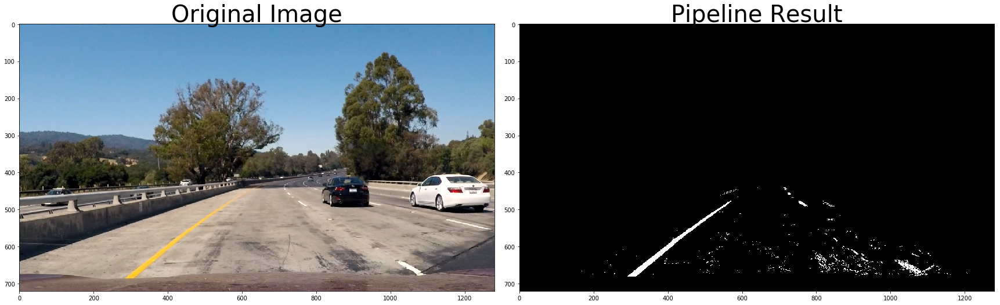

In [239]:
ksize = 7
offset = [500, 40, 600, 40, 100, 80, 60, 80]
# test the transforms with test image No1
image = cv2.imread('test_images/test1.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
result = pipeline(image, offset, ksize, dir_bin_thresh=(0.7, 1.3), mag_bin_thresh=(30, 100), hsv_thresh=(170, 255), s_thresh=(20, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



(720, 1280, 3)
(720, 1280)


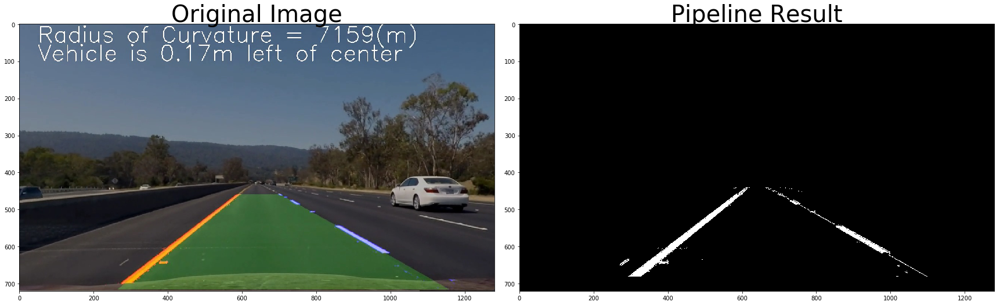

In [240]:
ksize = 7
offset = [500, 40, 600, 40, 100, 80, 60, 80]
# test the transforms with test image No1
image = cv2.imread('examples/example_output.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

result = pipeline(image, offset, ksize, dir_bin_thresh=(0.7, 1.3), mag_bin_thresh=(30, 100), hsv_thresh=(170, 255), s_thresh=(20, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [11]:
# Choose a Sobel kernel size
ksize = 7 # Choose a larger odd number to smooth gradient measurements
# test the transforms with test image No1
image = cv2.imread('test_images/test1.jpg')

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100)) # thresholds used in the course lectures
image = cv2.imread('test_images/test1.jpg')
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100)) # thresholds used in the course lectures
image = cv2.imread('test_images/test1.jpg')
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))  # thresholds used in the course lectures
image = cv2.imread('test_images/test1.jpg')
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3)) # thresholds used in the course lectures

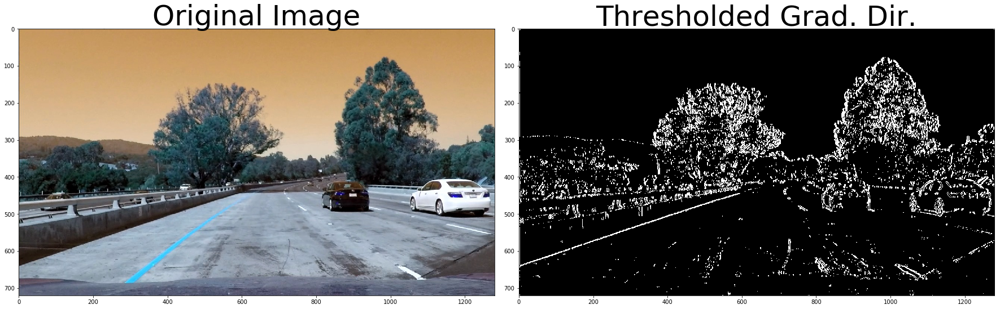

In [12]:
# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gradx, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

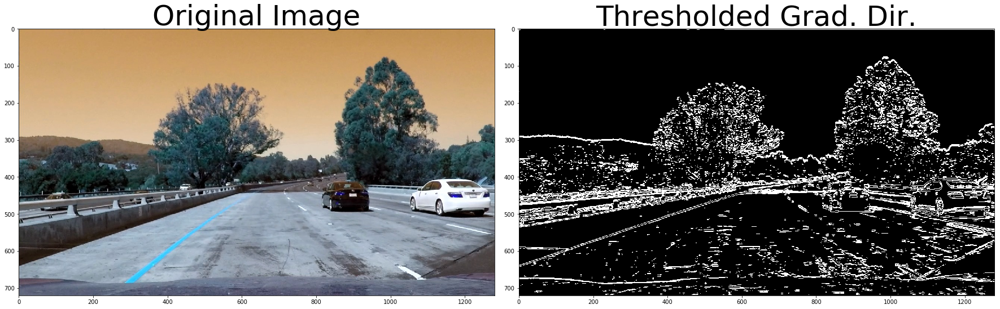

In [13]:
# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grady, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

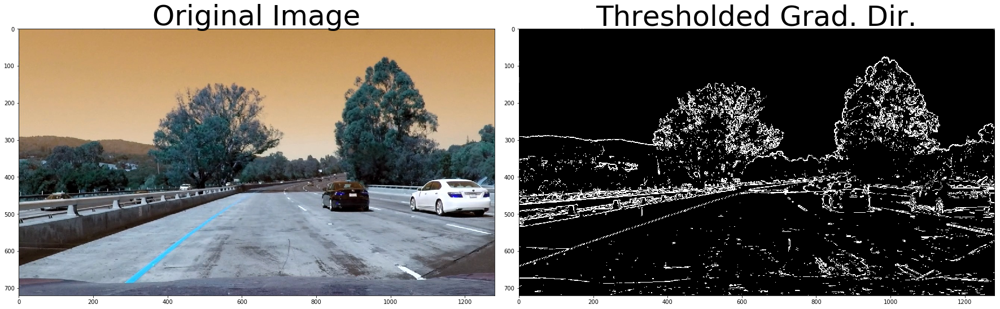

In [14]:
# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

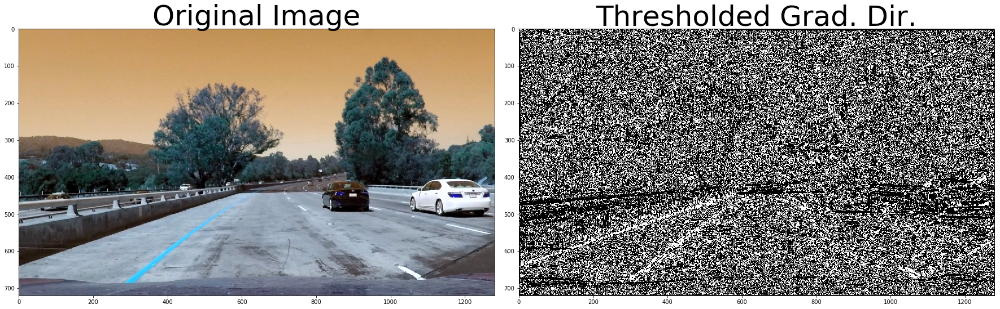

In [15]:
# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
combined = combine_grads(gradx, grady, mag_binary, dir_binary)

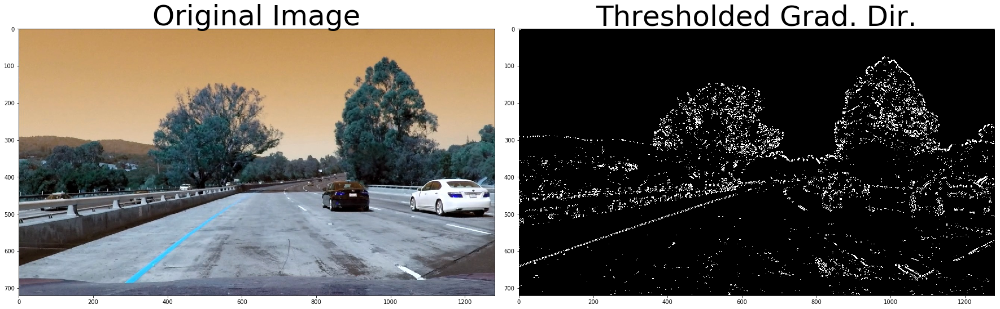

In [18]:
# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Create a colour Thresholded Image

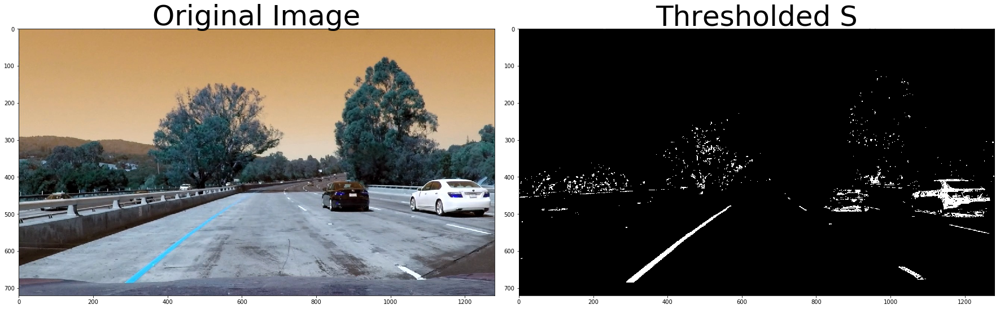

In [21]:
hls_binary = hls_select(image, thresh=(170, 255)) # threshold used in the course lectures

# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

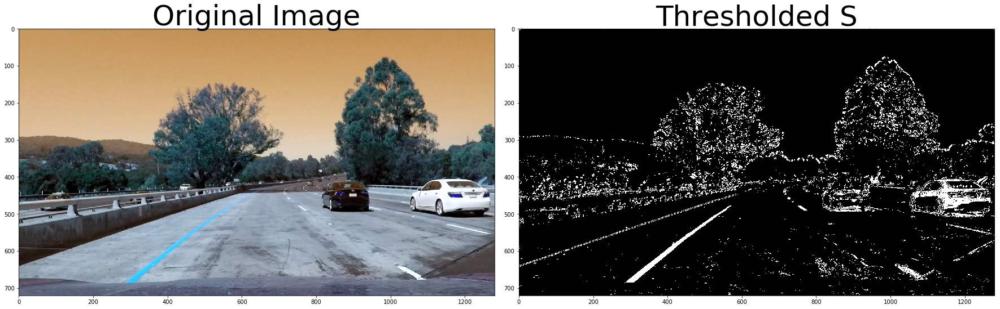

In [22]:
comb = combine_masks(combined, hls_binary)

# Plot the result
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(comb, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Combine color and gradient thresholds

In [23]:
#def combine_masks(combined, hls_binary):
#    comb = np.zeros_like(combined)
#    comb[(combined == 1) & (hls_binary == 1)] = 1
#    return combined


(720, 1280, 3)
(720, 1280)
(720, 1280)


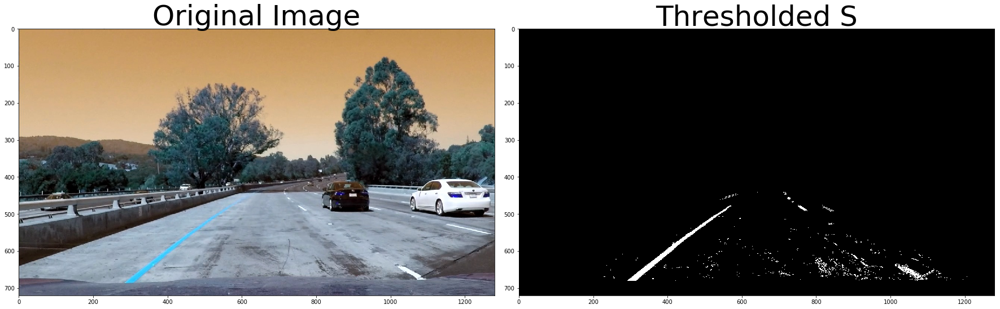

In [25]:
offset = [500, 40, 600, 40, 100, 80, 60, 80]
area = mark_area(image, offset)
print(comb.shape)
co = combine_all(gradx, grady, mag_binary, dir_binary, hls_binary, area)
%matplotlib inline
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(co, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

(720, 1280, 3)
(720, 1280)


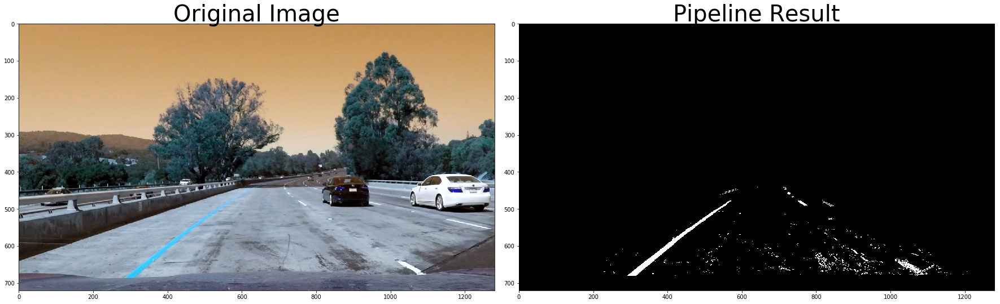

**4. Warp the Image Using perspective Transform**

In [55]:
import pickle
%matplotlib inline

# Test undistortion on an image
#images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
def undist(path, objpoints, imgpoints):
    # make a list of the images
    images = glob.glob(path)
    undist = []       
    for idx, fname in enumerate(images):
        print(fname)
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_size = (img.shape[1], img.shape[0])

        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


        dst = cv2.undistort(img, mtx, dist, None, mtx)
        undist.append(dst)
        cv2.imwrite('test_images/test_undist'+str(idx+1)+'.jpg',dst)

        # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
        #dist_pickle = {}
        #dist_pickle["mtx"] = mtx
        #dist_pickle["dist"] = dist
        #pickle.dump( dist_pickle, open( "test_images/test_dist"+str(idx+1)+"_pickle.p", "wb" ) )
        #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
        # Visualize undistortion
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return undist, mtx, dist

test_images/test1.jpg
test_images/test2.jpg
test_images/test3.jpg
test_images/test4.jpg
test_images/test5.jpg
test_images/test6.jpg
test_images/test_undist1.jpg
test_images/test_undist2.jpg
test_images/test_undist3.jpg
test_images/test_undist4.jpg
test_images/test_undist5.jpg
test_images/test_undist6.jpg


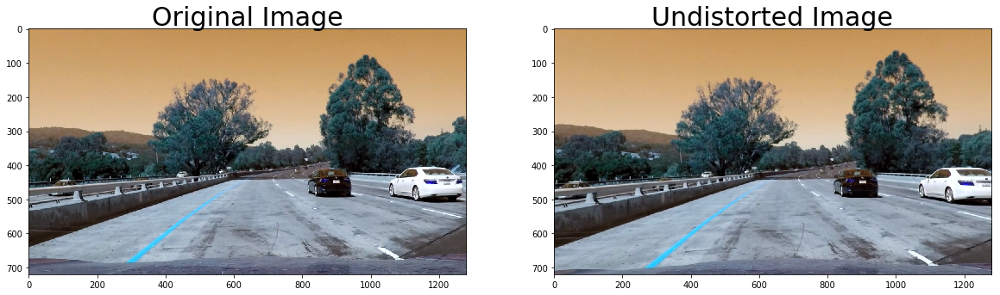

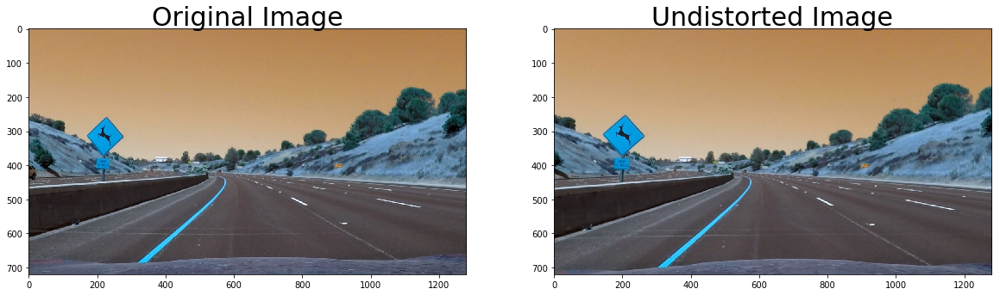

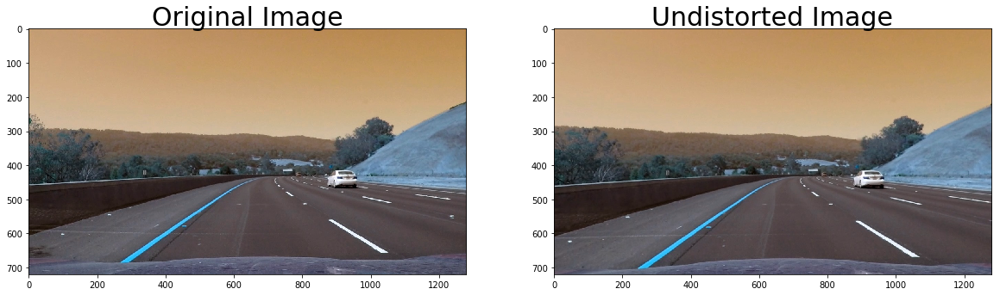

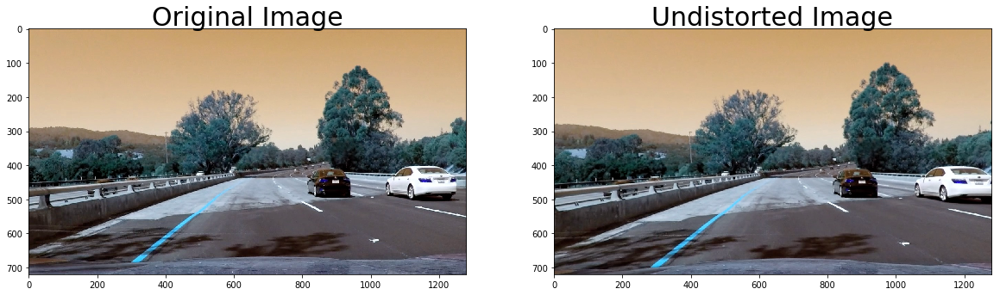

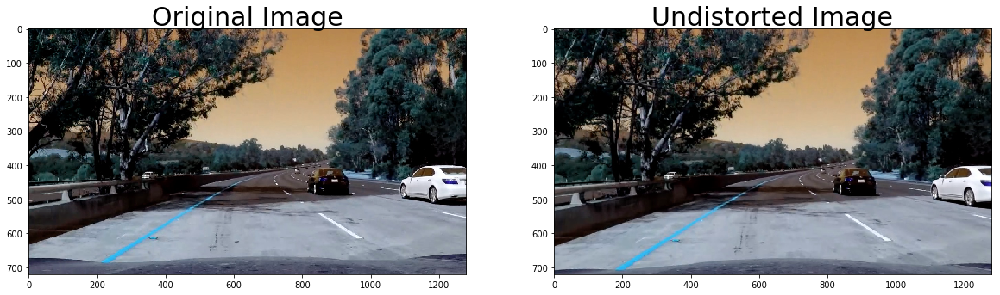

...

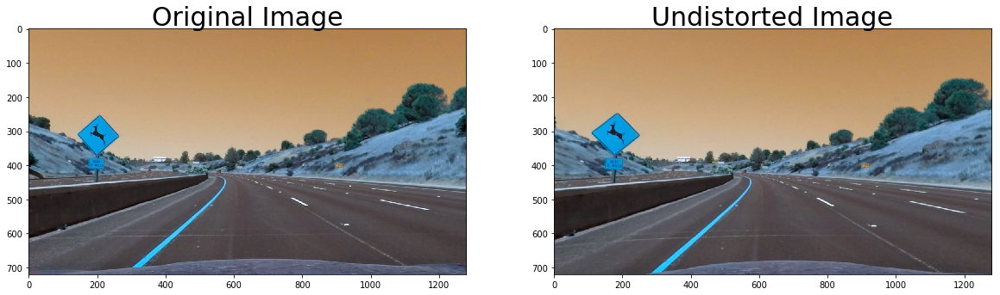

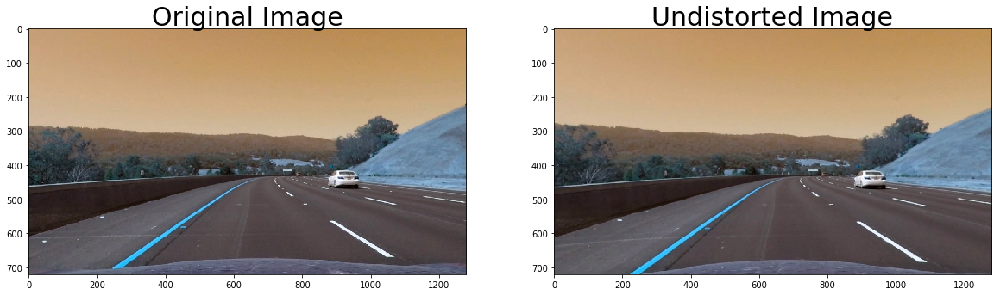

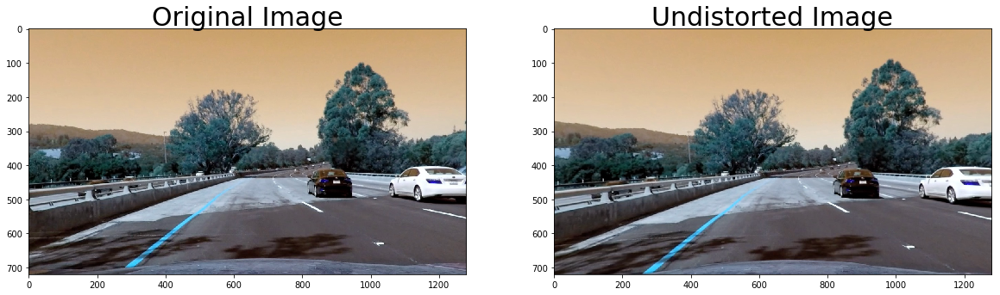

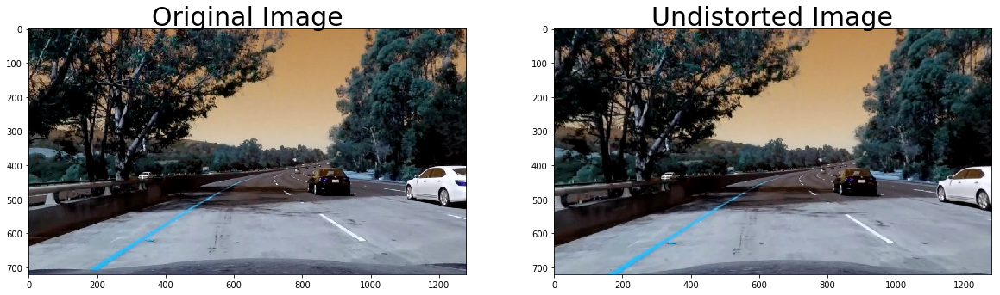

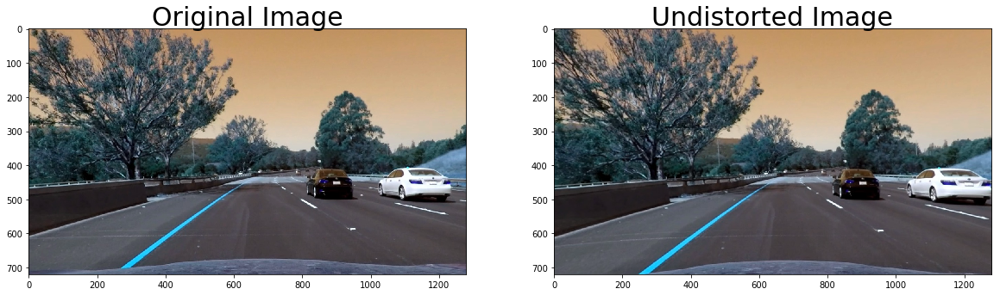

In [56]:
path = 'test_images/test*.jpg'
undist, mtx, dist = undist(path, objpoints, imgpoints)

In [96]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, corners, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    #undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    #gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    #ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    ret, corners = cv2.findChessboardCorners(img, (nx, ny), None) # image was already converted to grayscale

    if ret == True:
        # If we found corners, draw them! (just for fun)
        #cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret) # image had already distortion removed
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

In [170]:
import pickle
%matplotlib inline

# Test undistortion on an image
#images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
def undist(path, objpoints, imgpoints):
    # make a list of the images
    images = glob.glob(path)
    undist = []       
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_size = (img.shape[1], img.shape[0])

        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


        dst = cv2.undistort(img, mtx, dist, None, mtx)
        undist.append(dst)

    return undist, mtx, dist

In [271]:
import pickle
%matplotlib inline

# Test undistortion on an image
#images = glob.glob('test_images/test*.jpg')

# Step through the list and search for chessboard corners
def undist(path, objpoints, imgpoints):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    dst = cv2.undistort(img, mtx, dist, None, mtx)

    return dst, mtx, dist

In [272]:
# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, corners, nx, ny, mtx, dist):
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    #undist, mtx, dist = undist(path, objpoints, imgpoints)
    #gray = cv2.drawChessboardCorners(img, (8,6), corners, ret)
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (np.array(img).shape[1], np.array(img).shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([[550, 460],[710, 460], [1100, 700],[200, 700]])
    #src = np.float32([[545, 460],[735, 460], [1280, 700],[0, 700]])
    #area_of_interest = [[150+430,460],[1150-440,460],[1150,720],[150,720]]
    #src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    ##dst = np.float32([[offset, offset], [img_size[0]-offset, offset], [img_size[0]-offset, img_size[1]-offset], [offset, img_size[1]-offset]])
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    ##M = cv2.getPerspectiveTransform(src, dst)
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    ##warped = cv2.warpPerspective(dist, M, (img_size[1], img_size[0]), flags=cv2.INTER_LINEAR)
    #delete the next two lines
    #M = None
    #warped = np.copy(img) 
    ##return warped, M
    dst = np.float32([[0, 0],
                     [1100, 0],
                     [1100, 710],
                     [0, 710]])
    # Compute the perspective transform, M, given source and destination points
    M = cv2.getPerspectiveTransform(src, dst)
    # Compute the inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp an image using the perspective transform, M
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv

In [273]:
path = 'test_images/test6.jpg'
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

undist, mtx, dist = undist(path, objpoints, imgpoints)
import scipy.misc
rgb = scipy.misc.toimage(undist)
mydist = dist
print(mydist)

[[ -2.41017956e-01  -5.30721173e-02  -1.15810355e-03  -1.28318856e-04
    2.67125290e-02]]


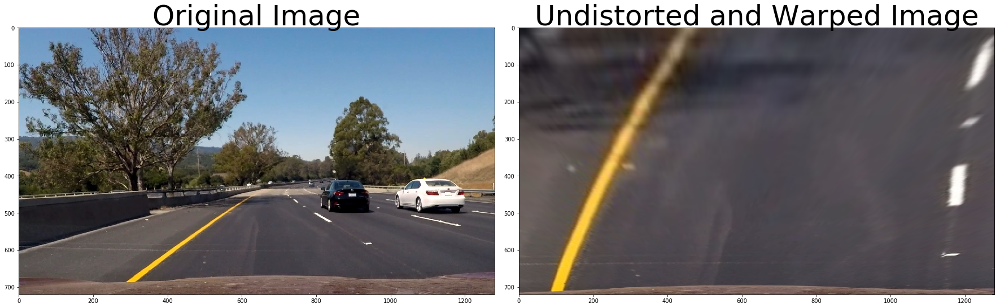

In [274]:
top_down, perspective_M = corners_unwarp(undist, imgpoints, nx, ny, mtx, mydist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

**5. Locate the Lane Lines**

**6. Implement Sliding Windows and Fit a Polynomial**

**7. Measure Curvature**

**8. Track Changes and Check if Curvature Makes Sense**

**9. Draw Result**